
### Structure of the notebook

I roughly followed the suggested structure, but I refactored the code to implement it in tensorflow 2.

The interesting (and gradable) section is at the end, under the "Examples" heading.

I hope you like it and do not hesitate to give any feedback or comment you consider interesting! 😃

# Image Captioning Final Project

In this final project you will define and train an image-to-caption model, that can produce descriptions for real world images!

<img src="images/encoder_decoder.png" style="width:70%">

Model architecture: CNN encoder and RNN decoder. 
(https://research.googleblog.com/2014/11/a-picture-is-worth-thousand-coherent.html)

# Import stuff

In [1]:
import sys
sys.path.append("..")
import grading
import download_utils

In [2]:
download_utils.link_all_keras_resources()

In [3]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
L = tf.keras.layers
K = tf.keras.backend
import utils
import time
import zipfile
import json
from collections import defaultdict
import re
import random
from random import choice
import grading_utils
import os
# from keras_utils import reset_tf_session
import tqdm_utils

# Prepare the storage for model checkpoints

In [4]:
# Leave USE_GOOGLE_DRIVE = False if you're running locally!
# We recommend to set USE_GOOGLE_DRIVE = True in Google Colab!
# If set to True, we will mount Google Drive, so that you can restore your checkpoint 
# and continue trainig even if your previous Colab session dies.
# If set to True, follow on-screen instructions to access Google Drive (you must have a Google account).
USE_GOOGLE_DRIVE = False

def mount_google_drive():
    from google.colab import drive
    mount_directory = "/content/gdrive"
    drive.mount(mount_directory)
    drive_root = mount_directory + "/" + list(filter(lambda x: x[0] != '.', os.listdir(mount_directory)))[0] + "/colab"
    return drive_root

CHECKPOINT_ROOT = ""
if USE_GOOGLE_DRIVE:
    CHECKPOINT_ROOT = mount_google_drive() + "/"

def get_checkpoint_path(epoch=None):
    if epoch is None:
        return os.path.abspath(CHECKPOINT_ROOT + "weights")
    else:
        return os.path.abspath(CHECKPOINT_ROOT + "weights_{}".format(epoch))
      
# example of checkpoint dir
# print(get_checkpoint_path(10))

# Fill in your Coursera token and email
To successfully submit your answers to our grader, please fill in your Coursera submission token and email

# Download data

Takes 10 hours and 20 GB. We've downloaded necessary files for you.

Relevant links (just in case):
- train images http://msvocds.blob.core.windows.net/coco2014/train2014.zip
- validation images http://msvocds.blob.core.windows.net/coco2014/val2014.zip
- captions for both train and validation http://msvocds.blob.core.windows.net/annotations-1-0-3/captions_train-val2014.zip

In [5]:
# we downloaded them for you, just link them here
download_utils.link_week_6_resources()

# Extract image features

We will use pre-trained InceptionV3 model for CNN encoder (https://research.googleblog.com/2016/03/train-your-own-image-classifier-with.html) and extract its last hidden layer as an embedding:

<img src="images/inceptionv3.png" style="width:70%">

In [6]:
IMG_SIZE = 299

In [7]:
# we take the last hidden layer of IncetionV3 as an image embedding
def get_cnn_encoder():
    K.set_learning_phase(False)
    model = keras.applications.InceptionV3(include_top=False)
    preprocess_for_model = keras.applications.inception_v3.preprocess_input

    model = keras.models.Model(model.inputs, keras.layers.GlobalAveragePooling2D()(model.output))
    return model, preprocess_for_model

Features extraction takes too much time on CPU:
- Takes 16 minutes on GPU.
- 25x slower (InceptionV3) on CPU and takes 7 hours.
- 10x slower (MobileNet) on CPU and takes 3 hours.

So we've done it for you with the following code:
```python
# load pre-trained model
reset_tf_session()
encoder, preprocess_for_model = get_cnn_encoder()

# extract train features
train_img_embeds, train_img_fns = utils.apply_model(
    "train2014.zip", encoder, preprocess_for_model, input_shape=(IMG_SIZE, IMG_SIZE))
utils.save_pickle(train_img_embeds, "train_img_embeds.pickle")
utils.save_pickle(train_img_fns, "train_img_fns.pickle")

# extract validation features
val_img_embeds, val_img_fns = utils.apply_model(
    "val2014.zip", encoder, preprocess_for_model, input_shape=(IMG_SIZE, IMG_SIZE))
utils.save_pickle(val_img_embeds, "val_img_embeds.pickle")
utils.save_pickle(val_img_fns, "val_img_fns.pickle")

# sample images for learners
def sample_zip(fn_in, fn_out, rate=0.01, seed=42):
    np.random.seed(seed)
    with zipfile.ZipFile(fn_in) as fin, zipfile.ZipFile(fn_out, "w") as fout:
        sampled = filter(lambda _: np.random.rand() < rate, fin.filelist)
        for zInfo in sampled:
            fout.writestr(zInfo, fin.read(zInfo))
            
sample_zip("train2014.zip", "train2014_sample.zip")
sample_zip("val2014.zip", "val2014_sample.zip")
```

In [8]:
# load prepared embeddings
train_img_embeds = utils.read_pickle("train_img_embeds.pickle")
train_img_fns = utils.read_pickle("train_img_fns.pickle")
val_img_embeds = utils.read_pickle("val_img_embeds.pickle")
val_img_fns = utils.read_pickle("val_img_fns.pickle")
# check shapes
print(train_img_embeds.shape, len(train_img_fns))
print(val_img_embeds.shape, len(val_img_fns))

(82783, 2048) 82783
(40504, 2048) 40504


In [9]:
# check prepared samples of images
list(filter(lambda x: x.endswith("_sample.zip"), os.listdir(".")))

['train2014_sample.zip', 'val2014_sample.zip']

# Extract captions for images

In [10]:
# extract captions from zip
def get_captions_for_fns(fns, zip_fn, zip_json_path):
    zf = zipfile.ZipFile(zip_fn)
    j = json.loads(zf.read(zip_json_path).decode("utf8"))
    id_to_fn = {img["id"]: img["file_name"] for img in j["images"]}
    fn_to_caps = defaultdict(list)
    for cap in j['annotations']:
        fn_to_caps[id_to_fn[cap['image_id']]].append(cap['caption'])
    fn_to_caps = dict(fn_to_caps)
    return list(map(lambda x: fn_to_caps[x], fns))
    
train_captions = get_captions_for_fns(train_img_fns, "captions_train-val2014.zip", 
                                      "annotations/captions_train2014.json")

val_captions = get_captions_for_fns(val_img_fns, "captions_train-val2014.zip", 
                                      "annotations/captions_val2014.json")

# check shape
print(len(train_img_fns), len(train_captions))
print(len(val_img_fns), len(val_captions))

82783 82783
40504 40504


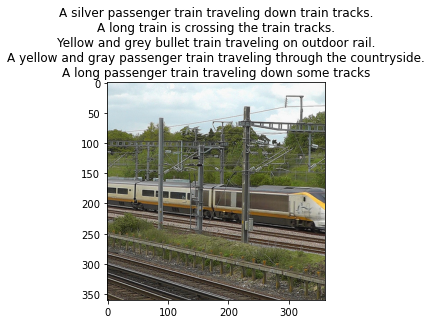

In [11]:
# look at training example (each has 5 captions)
def show_trainig_example(train_img_fns, train_captions, example_idx=0):
    """
    You can change example_idx and see different images
    """
    zf = zipfile.ZipFile("train2014_sample.zip")
    captions_by_file = dict(zip(train_img_fns, train_captions))
    all_files = set(train_img_fns)
    found_files = list(filter(lambda x: x.filename.rsplit("/")[-1] in all_files, zf.filelist))
    example = found_files[example_idx]
    img = utils.decode_image_from_buf(zf.read(example))
    plt.imshow(utils.image_center_crop(img))
    plt.title("\n".join(captions_by_file[example.filename.rsplit("/")[-1]]))
    plt.show()
    
# show_trainig_example(train_img_fns, train_captions, example_idx=142)
show_trainig_example(train_img_fns, train_captions, example_idx=7)

# Prepare captions for training

In [12]:
# preview captions data
train_captions[:2]

[['A long dirt road going through a forest.',
  'A SCENE OF WATER AND A PATH WAY',
  'A sandy path surrounded by trees leads to a beach.',
  'Ocean view through a dirt road surrounded by a forested area. ',
  'dirt path leading beneath barren trees to open plains'],
 ['A group of zebra standing next to each other.',
  'This is an image of of zebras drinking',
  'ZEBRAS AND BIRDS SHARING THE SAME WATERING HOLE',
  'Zebras that are bent over and drinking water together.',
  'a number of zebras drinking water near one another']]

In [13]:
from collections import Counter

In [14]:
# special tokens
PAD = "#PAD#"
UNK = "#UNK#"
START = "#START#"
END = "#END#"

# split sentence into tokens (split into lowercased words)
def split_sentence(sentence):
    return list(filter(lambda x: len(x) > 0, re.split('\W+', sentence.lower())))

def generate_vocabulary(train_captions):
    """
    Return {token: index} for all train tokens (words) that occur 5 times or more, 
        `index` should be from 0 to N, where N is a number of unique tokens in the resulting dictionary.
    Use `split_sentence` function to split sentence into tokens.
    Also, add PAD (for batch padding), UNK (unknown, out of vocabulary), 
        START (start of sentence) and END (end of sentence) tokens into the vocabulary.
    """
    vocab = Counter()
    for captions in train_captions:
        for caption in captions:
            vocab.update(split_sentence(caption))
    vocab_list = []
    for key, count in vocab.most_common():
        if count < 5:
            break
        vocab_list.append(key)
    
    for extra in [PAD, UNK, START, END]:
        vocab_list.append(extra)
    
    return {token: index for index, token in enumerate(sorted(vocab_list))}
    
def caption_tokens_to_indices(captions, vocab):
    """
    `captions` argument is an array of arrays:
    [
        [
            "image1 caption1",
            "image1 caption2",
            ...
        ],
        [
            "image2 caption1",
            "image2 caption2",
            ...
        ],
        ...
    ]
    Use `split_sentence` function to split sentence into tokens.
    Replace all tokens with vocabulary indices, use UNK for unknown words (out of vocabulary).
    Add START and END tokens to start and end of each sentence respectively.
    For the example above you should produce the following:
    [
        [
            [vocab[START], vocab["image1"], vocab["caption1"], vocab[END]],
            [vocab[START], vocab["image1"], vocab["caption2"], vocab[END]],
            ...
        ],
        ...
    ]
    """
    res = []
    for capt5 in captions:
        this_capt5 = []
        for caption in capt5:
            this_cap = [vocab[START]]
            for word in split_sentence(caption):
                try:
                    this_cap.append(vocab[word])
                except KeyError:
                    this_cap.append(vocab[UNK])
            this_cap.append(vocab[END])
            this_capt5.append(this_cap)
        res.append(this_capt5)
        
    
#     res = ### YOUR CODE HERE ###
    return res

In [15]:
# prepare vocabulary
vocab = generate_vocabulary(train_captions)
vocab_inverse = {idx: w for w, idx in vocab.items()}
print(len(vocab))

8769


In [16]:
# replace tokens with indices
train_captions_indexed = caption_tokens_to_indices(train_captions, vocab)
val_captions_indexed = caption_tokens_to_indices(val_captions, vocab)

Captions have different length, but we need to batch them, that's why we will add PAD tokens so that all sentences have an equal length. 

We will crunch LSTM through all the tokens, but we will ignore padding tokens during loss calculation.

In [17]:
# we will use this during training
def batch_captions_to_matrix(batch_captions, pad_idx, max_len=None):
    """
    `batch_captions` is an array of arrays:
    [
        [vocab[START], ..., vocab[END]],
        [vocab[START], ..., vocab[END]],
        ...
    ]
    Put vocabulary indexed captions into np.array of shape (len(batch_captions), columns),
        where "columns" is max(map(len, batch_captions)) when max_len is None
        and "columns" = min(max_len, max(map(len, batch_captions))) otherwise.
    Add padding with pad_idx where necessary.
    Input example: [[1, 2, 3], [4, 5]]
    Output example: np.array([[1, 2, 3], [4, 5, pad_idx]]) if max_len=None
    Output example: np.array([[1, 2], [4, 5]]) if max_len=2
    Output example: np.array([[1, 2, 3], [4, 5, pad_idx]]) if max_len=100
    Try to use numpy, we need this function to be fast!
    """
    if max_len is None:
        length = max(map(len, batch_captions))
    else:
        length = min(max_len, max(map(len, batch_captions)))
    
    matrix = np.array([xi[:max_len]+[pad_idx]*(length-len(xi)) for xi in batch_captions])
    
#     matrix = ###YOUR CODE HERE###
    return matrix

In [18]:
# make sure you use correct argument in caption_tokens_to_indices
assert len(caption_tokens_to_indices(train_captions[:10], vocab)) == 10
assert len(caption_tokens_to_indices(train_captions[:5], vocab)) == 5

# With TF 2

# Training

## Define architecture

Since our problem is to generate image captions, RNN text generator should be conditioned on image. The idea is to use image features as an initial state for RNN instead of zeros. 

Remember that you should transform image feature vector to RNN hidden state size by fully-connected layer and then pass it to RNN.

During training we will feed ground truth tokens into the lstm to get predictions of next tokens. 

Notice that we don't need to feed last token (END) as input (http://cs.stanford.edu/people/karpathy/):

<img src="images/encoder_decoder_explained.png" style="width:50%">

In [19]:
IMG_EMBED_SIZE = train_img_embeds.shape[1]
IMG_EMBED_BOTTLENECK = 120
WORD_EMBED_SIZE = 100
LSTM_UNITS = 300
LOGIT_BOTTLENECK = 120
pad_idx = vocab[PAD]

Here we define decoder graph.

We use Keras layers where possible because we can use them in functional style with weights reuse like this:
```python
dense_layer = L.Dense(42, input_shape=(None, 100) activation='relu')
a = tf.placeholder('float32', [None, 100])
b = tf.placeholder('float32', [None, 100])
dense_layer(a)  # that's how we applied dense layer!
dense_layer(b)  # and again
```

Here's a figure to help you with flattening in decoder:
<img src="images/flatten_help.jpg" style="width:80%">

In [20]:
# we use bottleneck here to reduce the number of parameters
# image embedding -> bottleneck

input_img_emb = L.Input(shape=(IMG_EMBED_SIZE))

img_embed_to_bottleneck = L.Dense(IMG_EMBED_BOTTLENECK, activation='elu')(input_img_emb)

img_embed_bottleneck_to_h0 = L.Dense(LSTM_UNITS, activation='elu')(img_embed_to_bottleneck)

input_sent = L.Input(shape=(None,))

word_embed = L.Embedding(len(vocab), WORD_EMBED_SIZE)(input_sent)
lstm = L.LSTM(LSTM_UNITS, return_sequences=True)(word_embed, initial_state=[img_embed_bottleneck_to_h0,img_embed_bottleneck_to_h0])


token_logits_bottleneck = L.Dense(LOGIT_BOTTLENECK, activation="elu")(lstm)

token_logits = L.Dense(len(vocab))(token_logits_bottleneck)



model = tf.keras.models.Model(inputs=[input_img_emb, input_sent], outputs=[token_logits])

In [21]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 2048)]       0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, None)]       0                                            
__________________________________________________________________________________________________
dense (Dense)                   (None, 120)          245880      input_1[0][0]                    
__________________________________________________________________________________________________
embedding (Embedding)           (None, None, 100)    876900      input_2[0][0]                    
______________________________________________________________________________________________

In [22]:
def loss(labels, logits):
    logits = tf.reshape(logits, [-1, len(vocab)])
    labels = tf.cast(tf.reshape(labels, [-1]), dtype='int32')
    loss_mask = tf.math.not_equal(labels, pad_idx)
    xent = tf.nn.sparse_softmax_cross_entropy_with_logits(
        labels=labels, 
        logits=logits
    )
    loss = tf.reduce_mean(tf.boolean_mask(tensor=xent, mask=loss_mask))
    return loss

In [23]:
train_captions_indexed = np.array(train_captions_indexed)
val_captions_indexed = np.array(val_captions_indexed)

<ipython-input-23-d32f0ba912b5>:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  train_captions_indexed = np.array(train_captions_indexed)
<ipython-input-23-d32f0ba912b5>:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  val_captions_indexed = np.array(val_captions_indexed)


In [29]:
model2 = tf.keras.models.Model(inputs=[input_img_emb, input_sent], outputs=[token_logits])

In [24]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=loss)

In [30]:
model2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=loss)

In [25]:
def generator(images_embeddings, indexed_captions, batch_size, max_len=None):
    while True:
        nums = np.random.choice(len(images_embeddings), size=batch_size, replace=False)
        nums2 = np.random.choice(5, size=batch_size)
        batch_image_embeddings = images_embeddings[nums]
    
        batch_captions_matrix = batch_captions_to_matrix([caption[ii] for [caption, ii] in zip(indexed_captions[nums], nums2)], pad_idx, max_len=max_len)      ### YOUR CODE HERE ###

        yield ([batch_image_embeddings, batch_captions_matrix[:,:-1]], np.array(batch_captions_matrix[:,1:], dtype='int64'))

In [26]:
batch_size = 64
n_epochs = 12
n_batches_per_epoch = 1000
n_validation_batches = 100  # how many batches are used for validation after each epoch

MAX_LEN = 20

In [28]:
class Validator(tf.keras.callbacks.Callback):
    def on_epoch_end(self, batch, logs=None):
        print('val_loss: ', self.model.evaluate(generator(val_img_embeds, val_captions_indexed, batch_size, MAX_LEN), steps=n_validation_batches))
        
validator = Validator()
board = tf.keras.callbacks.TensorBoard('logs2/')
saver = tf.keras.callbacks.ModelCheckpoint('saves2/model.ckpt', save_weights_only=True)

In [29]:
model.fit(generator(train_img_embeds, train_captions_indexed, batch_size, MAX_LEN), epochs=n_epochs, steps_per_epoch=n_batches_per_epoch,
         callbacks=[validator, board, saver], verbose=True)

Epoch 1/12
100/100 [==============================] - 1s 11ms/step - loss: 3.7516
val_loss:  3.7516493797302246
Epoch 2/12
100/100 [==============================] - 1s 11ms/step - loss: 3.2277
val_loss:  3.2277004718780518
Epoch 3/12
100/100 [==============================] - 1s 12ms/step - loss: 2.9721
val_loss:  2.972115993499756
Epoch 4/12
100/100 [==============================] - 1s 12ms/step - loss: 2.8930
val_loss:  2.893021821975708
Epoch 5/12
100/100 [==============================] - 1s 11ms/step - loss: 2.8194
val_loss:  2.819425106048584
Epoch 6/12
100/100 [==============================] - 1s 11ms/step - loss: 2.7801
val_loss:  2.780064582824707
Epoch 7/12
100/100 [==============================] - 1s 11ms/step - loss: 2.7365
val_loss:  2.736482620239258
Epoch 8/12
100/100 [==============================] - 1s 11ms/step - loss: 2.6931
val_loss:  2.6930594444274902
Epoch 9/12
100/100 [==============================] - 1s 11ms/step - loss: 2.6482
val_loss:  2.64819145202636

In [30]:
model.evaluate(generator(val_img_embeds, val_captions_indexed, batch_size, MAX_LEN), steps=n_validation_batches)

100/100 [==============================] - 1s 11ms/step - loss: 2.6202


2.6202445030212402

## Training loop
Evaluate train and validation metrics through training and log them. Ensure that loss decreases.

In [ ]:
# you can load trained weights here
# uncomment the next line if you need to load weights
# saver.restore(s, get_checkpoint_path(epoch=4))

Look at the training and validation loss, they should be decreasing!

In [31]:
# check that it's learnt something, outputs accuracy of next word prediction (should be around 0.5)
from sklearn.metrics import accuracy_score, log_loss

def decode_sentence(sentence_indices):
    return " ".join(list(map(vocab_inverse.get, sentence_indices)))

def check_after_training(n_examples):
    fd = generator(train_img_embeds, train_captions_indexed, batch_size).__next__()
    logits = model(fd[0])
    truth = fd[1]
    mask = (truth != pad_idx)
#     print(np.argmax(logits, axis=2).shape)
    print("Loss:", loss(truth, logits))
    print("Accuracy:", accuracy_score(np.argmax(logits, axis=2)[mask], truth[mask]))
    for example_idx in range(n_examples):
        print("Example", example_idx)
        print("Predicted:", decode_sentence(np.argmax(logits, axis=2).reshape((batch_size, -1))[example_idx]))
        print("Truth:", decode_sentence(truth.reshape((batch_size, -1))[example_idx]))
        print("")

check_after_training(3)

Loss: tf.Tensor(2.434033, shape=(), dtype=float32)
Accuracy: 0.4792243767313019
Example 0
Predicted: a living room has clean and ready #END# #END# furnishings is a #END# #END# #END# #END# #END# #END# #END# #END#
Truth: the living room is clean and empty because no one is home #END# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD#

Example 1
Predicted: a giraffe giraffe standing grass from a tree #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END#
Truth: a baby giraffe eating leaves on a meadow #END# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD#

Example 2
Predicted: a cars on the a cars lights on night #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END#
Truth: two vehicles cross under several street lights at night #END# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD#



# Applying model

Here we construct a graph for our final model.

It will work as follows:
- take an image as an input and embed it
- condition lstm on that embedding
- predict the next token given a START input token
- use predicted token as an input at next time step
- iterate until you predict an END token

In [32]:
encoder, preprocess_for_model = get_cnn_encoder()

/home/javier/Programas/anaconda3/envs/work/lib/python3.8/site-packages/tensorflow/python/keras/backend.py:434: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn('`tf.keras.backend.set_learning_phase` is deprecated and '


In [33]:
encoder.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 864         input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, None, None, 3 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, None, None, 3 0           batch_normalization[0][0]        
____________________________________________________________________________________________

In [34]:
def generate_caption(image, T=1, max_len=20, img_emb=None, verbose=False, beauty=False):
    """
    Generate caption for given image.
    if `sample` is True, we will sample next token from predicted probability distribution.
    `t` is a temperature during that sampling,
        higher `t` causes more uniform-like distribution = more chaos.
    """
    # condition lstm on the image
    
    if img_emb is not None:
        img_embed = np.array([img_emb])
    else:
#         img_embed = np.array([encoder(np.array([image]))])
        img_embed = [encoder(np.array(image))]
        
    caption = [vocab[START]]

    for ii in range(max_len):
        
        logits = model([img_embed, np.array([caption])])[0][ii]

        if T>0:
            logits = (logits/T) #/ tf.math.reduce_sum(new_probs**(1/t))
            next_word = tf.random.categorical(np.array([logits]), num_samples=1).numpy()[0,0]
        else:
            next_word = tf.argmax(logits).numpy()

        caption.append(next_word)
        if next_word == vocab[END]:
            break
        if verbose:
            print(' '.join(list(map(vocab_inverse.get, caption))))
       
    if beauty:
        result = ' '.join(list(map(vocab_inverse.get, caption[1:-1]))).capitalize()
    else:
        result = ' '.join(list(map(vocab_inverse.get, caption)))
    
    return result

In [35]:
generate_caption([0], img_emb=train_img_embeds[0], T=0.2, beauty=1)

'A stop sign on a snowy mountain with trees in the background'

In [36]:
train_captions[0]

['A long dirt road going through a forest.',
 'A SCENE OF WATER AND A PATH WAY',
 'A sandy path surrounded by trees leads to a beach.',
 'Ocean view through a dirt road surrounded by a forested area. ',
 'dirt path leading beneath barren trees to open plains']

In [37]:
# look at validation prediction example
def apply_model_to_image_raw_bytes(raw, T=0, n_captions=1):
    img = utils.decode_image_from_buf(raw)
    fig = plt.figure(figsize=(7, 7))
    plt.grid('off')
    plt.axis('off')
    plt.imshow(img)
    img = np.reshape(utils.crop_and_preprocess(img, (IMG_SIZE, IMG_SIZE), preprocess_for_model), [1, IMG_SIZE, IMG_SIZE, 3])
    for _ in range(n_captions):
        print(generate_caption(img, T=T, beauty=True))
    plt.show()

def show_valid_example(val_img_fns, example_idx=0, T=0, n_captions=1):
    zf = zipfile.ZipFile("val2014_sample.zip")
    all_files = set(val_img_fns)
    found_files = list(filter(lambda x: x.filename.rsplit("/")[-1] in all_files, zf.filelist))
    example = found_files[example_idx]
    apply_model_to_image_raw_bytes(zf.read(example), T=T, n_captions=n_captions)
    

A man is sitting on a bench with a dog
A man is sitting on a bench with a dog
A man is sitting on a bench with a dog
A man is sitting on a bench with a dog
A man and a woman are sitting on a bench


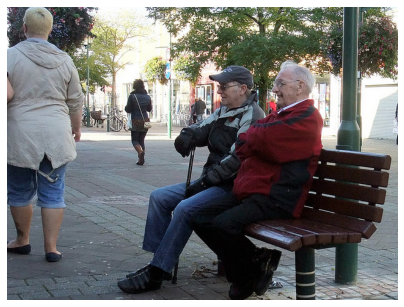

In [38]:
show_valid_example(val_img_fns, example_idx=101, n_captions=5, T=0.2)

A red double decker bus parked in a lot
A yellow and yellow bus parked in a lot
A red double decker bus parked in a lot
A red double decker bus parked on the side of a street
A red double decker bus parked in a lot


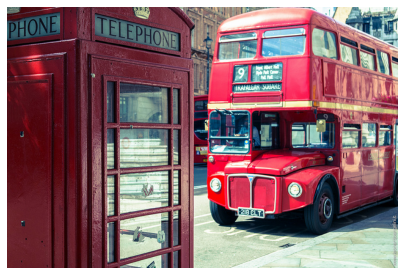

A dog laying on a couch with a dog on it s head
A dog laying on the ground with a dog
A dog is laying on a bed with a dog
A dog laying on the ground next to a dog
A dog laying on a bed with a dog


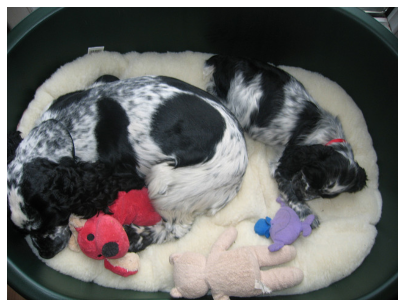

A person holding a hot dog with onions and mustard
A hot dog with mustard and mustard on it
A plate with a sandwich and a sandwich on it
A sandwich with a pickle and a pickle on it
A hot dog with a pickle on top of it


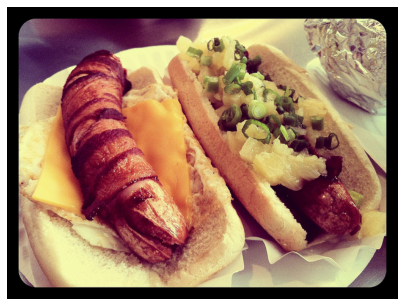

A group of people sitting on a couch with a wii remote
A group of people sitting on a couch
A group of people sitting on a couch with a wii remote
A group of people sitting on a couch with a wii remote
A group of people sitting on a couch with a wii remote


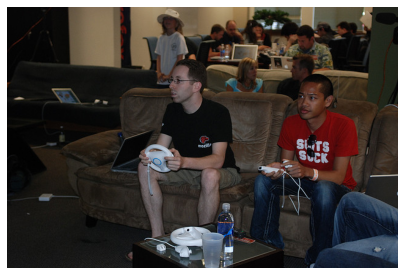

A man is riding a horse in a field
A man is riding a horse in a field
A man is on the back of a horse
A man is riding a horse on a field
A man is riding a horse on a field


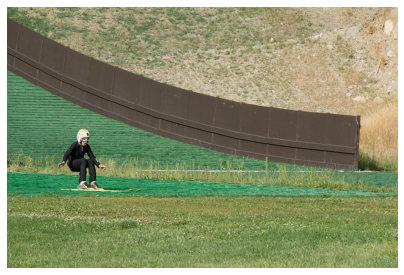

A group of people standing around a table with a tennis racket
A group of people standing in a room with a woman
A group of people standing on a tennis court
A group of men standing next to each other on a tennis court
A group of people standing around a table with a woman


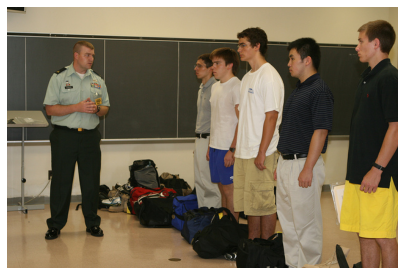

A man with a boat on a river with a mountain range in the background
A man is standing on a boat in the water
A man is standing on a lake with a boat in the background
A man in a boat is walking through the water
A man is standing on the beach with a boat


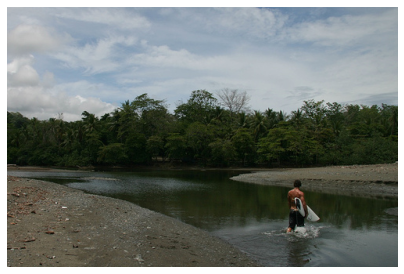

A herd of zebra walking through a field
A herd of zebra walking through a field
A herd of zebra walking through a field
A herd of zebra standing on top of a grass covered field
A herd of zebra walking through a field


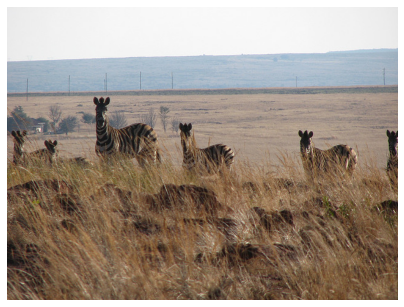

A black bear is eating from a tree
A black bear is eating grass in the grass
A black bear is eating grass in the grass
A black bear is eating grass in the grass
A black bear is eating grass in a field


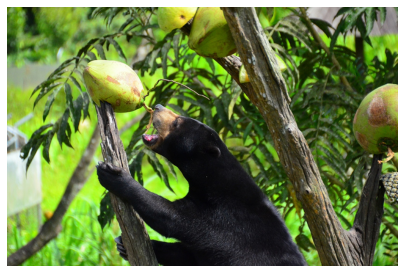

A table with a glass of wine and wine bottles
A table with a glass of wine and wine glasses
A table with a glass of wine and wine
A table with wine glasses and wine glasses
A table with a glass of wine and wine glasses


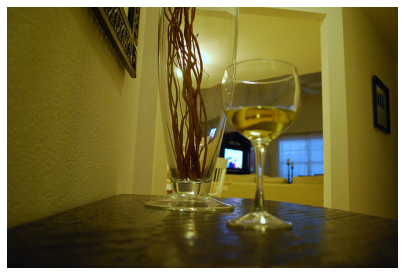

In [39]:
# sample more images from validation
for idx in np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 10):
    show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)
    time.sleep(1)

You can download any image from the Internet and appply your model to it!

In [64]:
download_utils.download_file(
    "http://www.bijouxandbits.com/wp-content/uploads/2016/06/portal-cake-10.jpg",
    "portal-cake-10.jpg"
)

In [64]:
download_utils.download_file(
    "https://images.theconversation.com/files/304957/original/file-20191203-66986-im7o5.jpg?ixlib=rb-1.1.0&q=45&auto=format&w=1200&h=1200.0&fit=crop",
    "portal-cake-10.jpg"
)

Now it's time to find 10 examples where your model works good and 10 examples where it fails! 

You can use images from validation set as follows:
```python
show_valid_example(val_img_fns, example_idx=...)
```

You can use images from the Internet as follows:
```python
! wget ...
apply_model_to_image_raw_bytes(open("...", "rb").read())
```

If you use these functions, the output will be embedded into your notebook and will be visible during peer review!

When you're done, download your noteboook using "File" -> "Download as" -> "Notebook" and prepare that file for peer review!

That's it! 

Congratulations, you've trained your image captioning model and now can produce captions for any picture from the  Internet!

# Examples

I produce 5 captions for each image, at a very low temperature of $T=0.2$. This means that the chosen word is almost always the one with larger probability.

With the following examples, I show 10 images where I consider that the produced captions properly reflect the image.

Then, I show 10 images where the captions fail to decribe the image.

I finish with some interesting examples and remarks.

For every image, I write a small comment.

## Properly working

Example 341 of the validation data

A zebra standing in a field of grass
A zebra grazing on a lush green field
A zebra standing on top of a grass covered field
A zebra standing in a field with trees in the background
A zebra is standing in the grass next to a herd of zebra


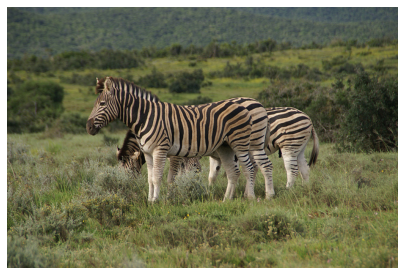

In [48]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

Perfectly fine captions, although only one of them recognize the herd.

Example 1 of the validation data

A living room with a couch and a table
A living room with a couch and a table
A living room with a couch and a table
A living room with a couch and a table
A living room with a couch and a table


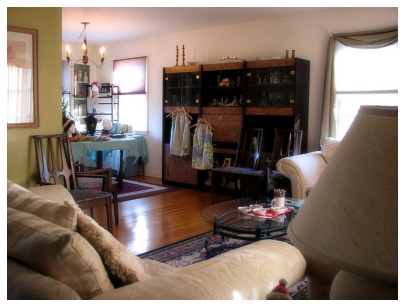

In [51]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

Very clear caption with no variation; correct description

Example 81 of the validation data

A group of people standing around a table
A group of people standing around a table
A group of men are standing around a table
A group of people standing around a table
A group of people are standing around a table


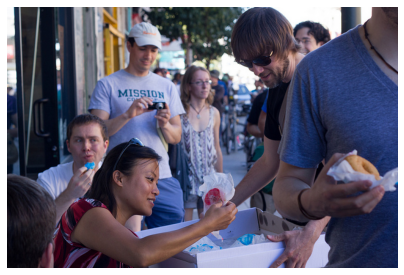

In [52]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

Roughly correct caption. Worringly, it seems to consider "men" as a synonym of "people"; a detailed analysis of its biases should be performed before deploying a network like this in real life.

Example 387 of the validation data

A yellow fire hydrant sitting in the grass
A red fire hydrant sitting on the grass
A red fire hydrant is on the side of a road
A red fire hydrant sitting in the grass
A red fire hydrant sitting next to a tree


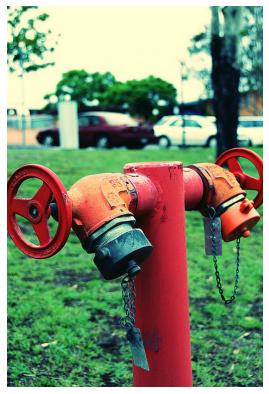

In [54]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

Roughly correct captions; it is interesting that the first caption claims the fire hydrant to be yellow, the rest are correct.

Example 197 of the validation data

A table with a glass of wine and wine
A table with a wine glass and wine glass
A table with a glass of wine and wine
A table with a glass of wine and wine
A table with a glass of wine and wine on it


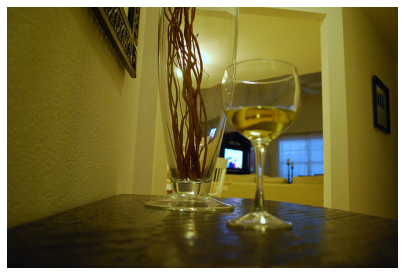

In [57]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

The construction of the sentence does not feel very natural (at least to me), but the description is correct.

Example 32 of the validation data

A plate of fries and a sandwich on a plate
A plate with a sandwich and french fries
A sandwich with meat and meat on a plate
A plate with a sandwich and french fries
A plate with a sandwich and a sandwich on it


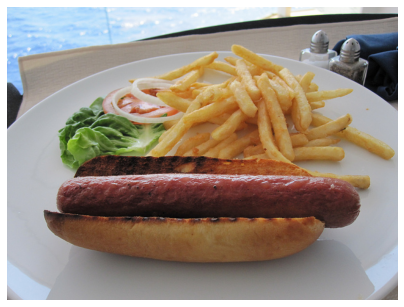

In [60]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

This is probably controversial, but the captions are correct if we recognize that a hotdog is a kind of sandwich (broadly defined).

Example 300 of the validation data

A herd of zebras in a field of grass
A herd of zebra walking through a field
A herd of zebra grazing on grass in a field
A herd of zebra walking through a field
A herd of zebra walking through a field


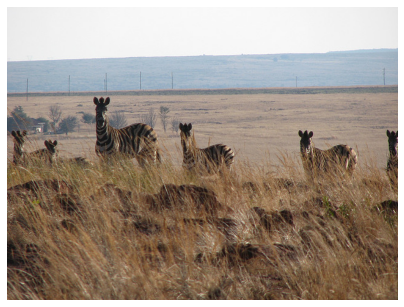

In [61]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

The networks properly describes a herd or zebras and its location.

Example 96 of the validation data

A microwave oven and microwave on a table
A microwave oven and microwave on a counter
A microwave oven and a microwave on a counter
A microwave oven sitting on top of a table
A microwave oven sitting on top of a stove


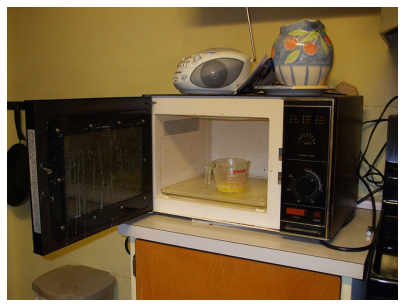

In [62]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

The captions correctly identify the main items, although some of them repeat the microwave.

Example 282 of the validation data

A giraffe is standing in the grass near a fence
A giraffe is standing in the grass near a tree
A giraffe is standing in the grass near a tree
A giraffe is standing in the grass next to a tree
A giraffe is standing in the grass with trees in the background


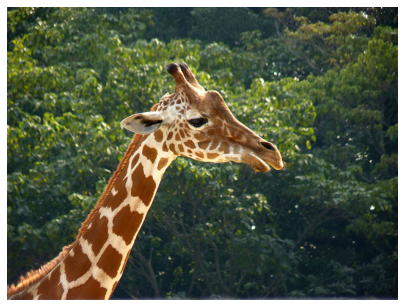

In [67]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

All options identify the giraffe; it assumes that it is standing of grass, which can not be seen in the image, but correctly describe the trees.

Example 277 of the validation data

A man in a kitchen with a refrigerator
A man is standing in the kitchen with a refrigerator
A man in a kitchen with a refrigerator and a stove
A man is standing in a kitchen with a refrigerator
A man is standing in a kitchen with a refrigerator


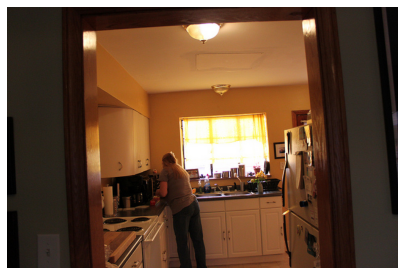

In [70]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

These captions are essentially correct; however, the network assumes the person is a man. This may be a very worring signal that the network consider "man" and "person" as synonyms. A detailed analysis of bias should be performed before applying the network in the real world.

## Not properly working

Example 90 of the validation data

A brown and white dog laying on top of a grass covered field
A small polar bear with a white and white dog on the ground
A small dog is standing on a rock
A small polar bear is laying on a rock
A small polar bear is standing on a rock


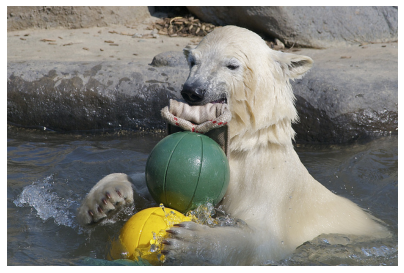

In [49]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

This seems to be quite a challenging image to caption (even for me); the network identify the polar bear, but not their activity or size.

Example 131 of the validation data

A girl with a hat and a hat on a field
A girl with a blue hat and a hat on a grass field
A woman with a hat and a hat on a bench
A woman with a hat and a hat on a grass covered field
A woman with a hat and a hat on a field


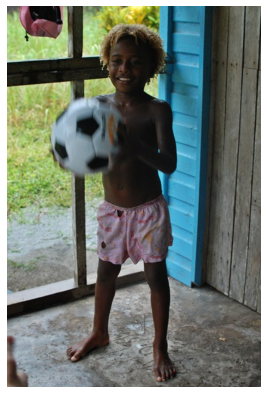

In [46]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

Clearly wrong, the prediction is fixated with a hat (parhaps mistaking the hair or the plant outside), plus the person is clearly not a woman

Example 325 of the validation data

A man and woman are standing in a room
A man and woman are standing in front of a table
A man and woman are standing in a room
Two men are standing in front of a table
A man and woman are standing in a room


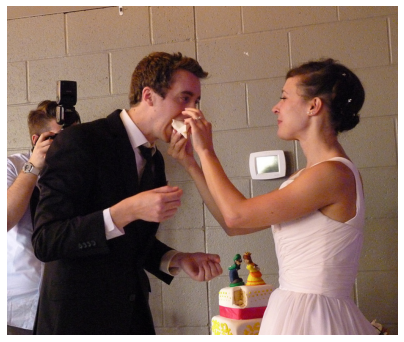

In [50]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

Although the caption is technically correct, it fails to identify that this is a wedding (probably the most important aspect of the image).

Example 149 of the validation data

A man is walking on the water with a boat in the water
A man is standing on a boat in the water
A man is standing on the snow with a boat on it
A man and a woman are walking down the water
A man with a hat on a boat in the water


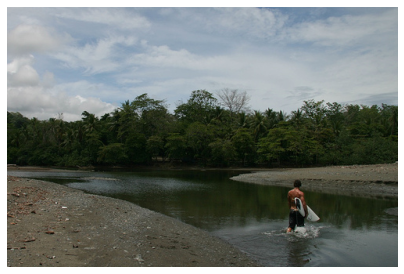

In [53]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

Although the main elements are identified (man, boat, water), the captions do not put them together correctly.

Example 133 of the validation data

A living room with a couch and a table
A bedroom with a large bed and a table
A room with a table and a table
A living room with a couch and a tv
A room with a table and a table with a table


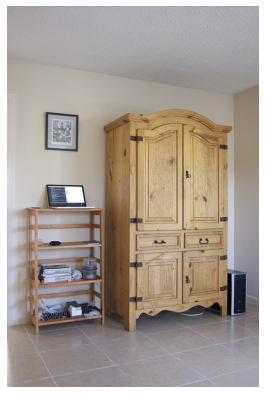

In [55]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

The network correctly identifies that this is a room, but assumes the usual items of a room instead of describing the image. If it acts the same for people in the images, the result could be very dangerous.

Example 204 of the validation data

A man is sitting on a park bench
A man is standing on a sidewalk with a clock on it
A man with a red shirt and black shirt and a black umbrella
A man is standing on a park bench
A man that is standing on a sidewalk


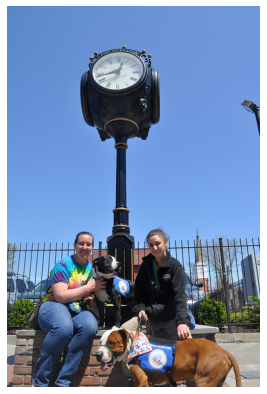

In [56]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

People in the image seem to be women, but the caption claim that they are a single man.

Example 234 of the validation data

A man with a beard and a glass of wine
A man with a beard and a glass of beer
A man with glasses is eating a donut
A man is eating a hot dog in a kitchen
A man with glasses is eating a hot dog


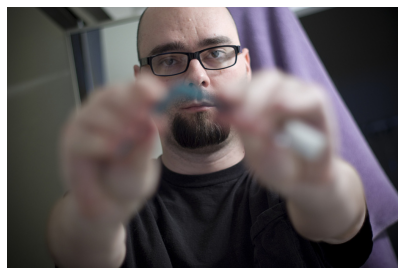

In [58]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

This image is difficult to caption due to the out-of-focus object; the network (seemingly correctly) identifies a man with a beard and glasses, but missclassify the location or activity.

Example 288 of the validation data

A man is running on a grass field
A man is running a dog on a field
A man is running with a frisbee in his hand
A man is running on a grass field
A man is playing with a frisbee in a field


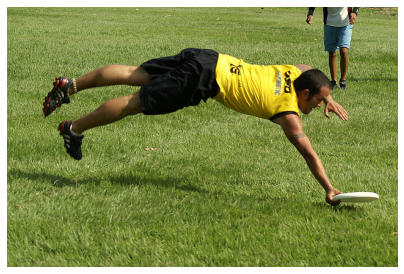

In [59]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

Only one of the options is correctly identifying the person playing with a frisbee.

Example 55 of the validation data

A young boy is running on a field with a bat
A baseball player is running on a field
A young boy is running on the field with a bat
A baseball player is running on the field
A young boy is running on the field with a bat


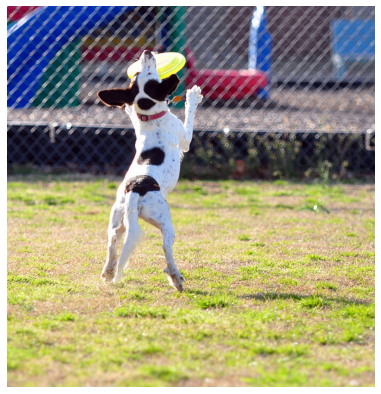

In [68]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

This good boy may have a promising carrer in baseball, but the captioning should make it clear that it is a dog.

Example 293 of the validation data

A woman with a hat on her phone
A woman with a hat and a hat on a bench
A woman with a hat and a hat on her phone
A woman sitting on a bench with a clock
A woman is sitting on a bench with a kite


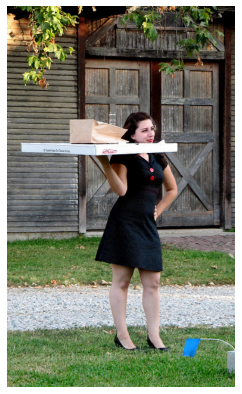

In [72]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

The network describes (seemingly correctly) the person as a woman, but completely miss the huge pizza box and make up a hat and other elements.

## Interesting examples

Example 268 of the validation data

A man is cutting a piece of bread with a knife
A display of a bunch of doughnuts on display
A display case of doughnuts on display in a store
A man is cutting a piece of bread with a knife
A man is cutting a piece of bread with a knife


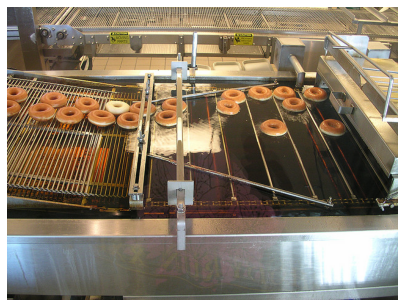

In [63]:
# sample more images from validation
idx = np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 1)[0]
print(f'Example {idx} of the validation data\n')
show_valid_example(val_img_fns, example_idx=idx, n_captions=5, T=0.2)

Two of the options nail it, the other three agree in their mistake.

A close up of a clock on a pole
A close up of a clock on the side of a building
A close up of a clock on a pole
A close up of a clock on a pole
A close up of a traffic light


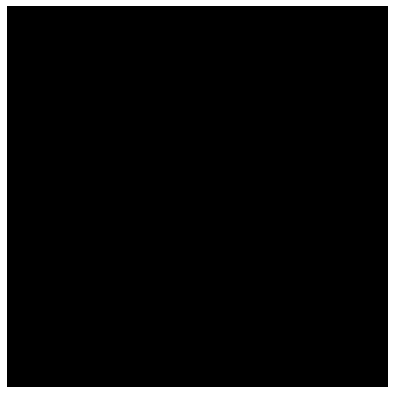

In [80]:
img = np.ones((IMG_SIZE, IMG_SIZE, 3))*0
fig = plt.figure(figsize=(7, 7))
plt.grid('off')
plt.axis('off')
plt.imshow(img)
img = np.reshape(utils.crop_and_preprocess(img, (IMG_SIZE, IMG_SIZE), preprocess_for_model), [1, IMG_SIZE, IMG_SIZE, 3])
for _ in range(5):
    print(generate_caption(img, T=0.2, beauty=True))
plt.show()

A black square is identified as a close up of a clock (maybe it is very close)

A close up of a clock on the top of a building
A close up of a very tall clock
A close up of a clock on the side of a building
A close up of a clock on the top of a building
A close up of a street light with a sky background


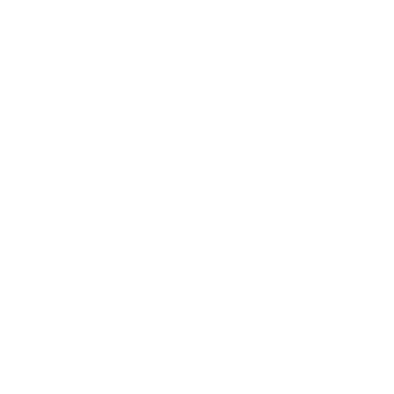

In [81]:
img = np.ones((IMG_SIZE, IMG_SIZE, 3))*1
fig = plt.figure(figsize=(7, 7))
plt.grid('off')
plt.axis('off')
plt.imshow(img)
img = np.reshape(utils.crop_and_preprocess(img, (IMG_SIZE, IMG_SIZE), preprocess_for_model), [1, IMG_SIZE, IMG_SIZE, 3])
for _ in range(5):
    print(generate_caption(img, T=0.2, beauty=True))
plt.show()

A white square is also identified as a close up of a clock, but higher in the sky.

A man is standing on a sidewalk holding a cell phone
A man is sitting on a bench in the rain
A man in a hat and tie talks on a cell phone
A man is standing next to a man on a cell phone
A man is sitting on a bench with a phone


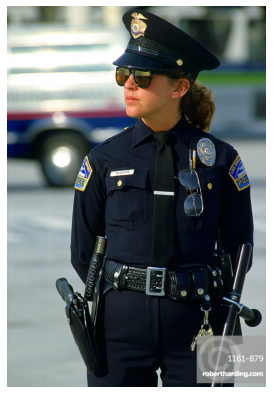

In [87]:
apply_model_to_image_raw_bytes(open("pol1.jpg", "rb").read(), T=0.2, n_captions=5)

A man in a black shirt and a hat
A man is sitting on a bench with a man and a woman
A man is sitting on a bench with a man on it
A man is holding a small dog with a man on a cell phone
A man in a hat is sitting on a bench


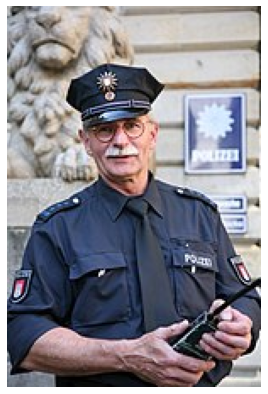

In [88]:
apply_model_to_image_raw_bytes(open("pol2.jpg", "rb").read(), T=0.2, n_captions=5)

Our captioning network is unable to identify police officers. More worringly, as suspected by the examples above, it describes the police woman as a man. The network seems to have learned that "man" just means "person". More care should be put into the training set and the removal of unwanted biases, if a network like this is to be implemented in the real world.

### Thank you for looking at my notebook

Please accept this present, it is:

A cake on a plate with a fork and fork
A cake with icing and sprinkles on it
A cake with icing on it s face on a table
A cake with icing and sprinkles on it
A cake with a knife and a fork on it


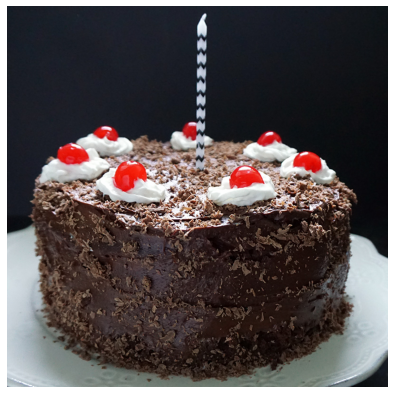

In [92]:
print('Please accept this present, it is:\n')
apply_model_to_image_raw_bytes(open("portal-cake-10.jpg", "rb").read(), T=0.2, n_captions=5)